In [64]:
!pip install torch torchvision albumentations -q

In [65]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

print("Đã cài đặt xong.")

Đã cài đặt xong.


In [66]:
import os
import json
import numpy as np
import cv2
from tqdm import tqdm

base_folder = '/kaggle/input/btl-dataset/train'   
input_folder = base_folder
coco_json_path = os.path.join(base_folder, '_annotations.coco.json')

output_images_dir = '/kaggle/working/spinach_dataset_final/images'
output_masks_dir = '/kaggle/working/spinach_dataset_final/masks'

os.makedirs(output_images_dir, exist_ok=True)
os.makedirs(output_masks_dir, exist_ok=True)

# category_id trong COCO annotation -> label trong mask (0: background, 1: leaf, 2: coin)
category_mapping = {
    1: 2,   # Coin -> pixel = 2
    2: 1    # Leaf -> pixel = 1
}

#Đọc file COCO JSON
with open(coco_json_path, 'r') as f:
    coco_data = json.load(f)

#Gom annotation theo từng ảnh
image_id_to_filename = {img['id']: img['file_name'] for img in coco_data['images']}
annotations_per_image = {}
for ann in coco_data['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

#Convert từng ảnh
for img_info in tqdm(coco_data['images'], desc="Đang convert ảnh và mask"):
    img_id = img_info['id']
    file_name = img_info['file_name']
    width = img_info['width']
    height = img_info['height']

    mask = np.zeros((height, width), dtype=np.uint8)

    anns = annotations_per_image.get(img_id, [])

    for ann in anns:
        cat_id = ann['category_id']
        if cat_id not in category_mapping:
            continue
        mapped_label = category_mapping[cat_id]
        segmentation = ann['segmentation']

        if isinstance(segmentation, list):
            for seg in segmentation:
                points = np.array(seg).reshape((-1, 2)).astype(np.int32)
                cv2.fillPoly(mask, [points], color=mapped_label)

    #Lưu ảnh gốc
    src_img_path = os.path.join(input_folder, file_name)
    if os.path.exists(src_img_path):
        dst_img_path = os.path.join(output_images_dir, file_name)
        img = cv2.imread(src_img_path)
        cv2.imwrite(dst_img_path, img)

    #Lưu mask phân lớp
    mask_save_name = os.path.splitext(file_name)[0] + '_mask.png'
    cv2.imwrite(os.path.join(output_masks_dir, mask_save_name), mask)

print("Đã convert xong bộ ảnh và mask chuẩn multi-class (0: bg, 1: leaf, 2: coin)")


Đang convert ảnh và mask: 100%|██████████| 399/399 [00:03<00:00, 118.36it/s]

Đã convert xong bộ ảnh và mask chuẩn multi-class (0: bg, 1: leaf, 2: coin)


In [67]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch

class SpinachDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transforms=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transforms = transforms
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        base_name = os.path.splitext(img_name)[0]
        mask_name = base_name + '_mask.png'

        img_path = os.path.join(self.image_dir, img_name)
        mask_path = os.path.join(self.mask_dir, mask_name)

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if self.transforms:
            augmented = self.transforms(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        return image, mask.long()

# Augmentation
train_transform = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0)),
    ToTensorV2()
])

# Đường dẫn sau khi convert
image_dir = '/kaggle/working/spinach_dataset_final/images'
mask_dir = '/kaggle/working/spinach_dataset_final/masks'

# Load Data
all_files = os.listdir(image_dir)
np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files, val_files = all_files[:split_idx], all_files[split_idx:]

train_dataset = SpinachDataset(image_dir, mask_dir, transforms=train_transform)
val_dataset = SpinachDataset(image_dir, mask_dir, transforms=val_transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

print("DataLoader đã tạo xong.")


DataLoader đã tạo xong.


In [68]:
import torch.nn as nn

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=3):
        super(UNet, self).__init__()
        self.enc1 = DoubleConv(n_channels, 64)
        self.enc2 = DoubleConv(64, 128)
        self.enc3 = DoubleConv(128, 256)
        self.enc4 = DoubleConv(256, 512)

        self.pool = nn.MaxPool2d(2)

        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        self.final = nn.Conv2d(64, n_classes, 1)

    def forward(self, x):
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))

        dec3 = self.upconv3(enc4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.dec3(dec3)

        dec2 = self.upconv2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.dec2(dec2)

        dec1 = self.upconv1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.dec1(dec1)

        return self.final(dec1)

print(" Model UNet đã được xây dựng.")


 Model UNet đã được xây dựng.


In [69]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

model = UNet(n_channels=3, n_classes=3).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# Thêm trọng số cho CrossEntropyLoss
# Ưu tiên đồng xu: lớp 2 có trọng số cao
# Ví dụ: nền (class 0): 0.3, lá (class 1): 0.5, đồng xu (class 2): 2.0
class_weights = torch.tensor([0.3, 0.5, 2.0]).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

num_epochs = 200
patience = 20  # Số epoch kiên nhẫn cho EarlyStopping

best_loss = float('inf')
epochs_no_improve = 0
best_model_path = '/kaggle/working/unet_multiclass_spinach_best.pth'

for epoch in range(num_epochs):
    model.train()
    train_loss = 0

    for images, masks in tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}'):
        images, masks = images.to(device), masks.to(device)

        outputs = model(images)  # [B, 3, H, W]
        loss = criterion(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_loss = train_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}")

    # Kiểm tra nếu loss tốt hơn
    if avg_loss < best_loss:
        best_loss = avg_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), best_model_path)
        print(f" Model improved and saved at Epoch {epoch+1}")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epochs.")

    # EarlyStopping
    if epochs_no_improve >= patience:
        print(f" Early stopping triggered at epoch {epoch+1}")
        break

print(f"\n Training complete. Best model saved at: {best_model_path}")


Epoch 1/200: 100%|██████████| 50/50 [00:10<00:00,  4.60it/s]


Epoch 1/200, Loss: 0.8731
 Model improved and saved at Epoch 1


Epoch 2/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 2/200, Loss: 0.3614
 Model improved and saved at Epoch 2


Epoch 3/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 3/200, Loss: 0.1857
 Model improved and saved at Epoch 3


Epoch 4/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 4/200, Loss: 0.1437
 Model improved and saved at Epoch 4


Epoch 5/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 5/200, Loss: 0.1204
 Model improved and saved at Epoch 5


Epoch 6/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 6/200, Loss: 0.1298
 No improvement for 1 epochs.


Epoch 7/200: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]


Epoch 7/200, Loss: 0.1075
 Model improved and saved at Epoch 7


Epoch 8/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 8/200, Loss: 0.0716
 Model improved and saved at Epoch 8


Epoch 9/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 9/200, Loss: 0.0597
 Model improved and saved at Epoch 9


Epoch 10/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 10/200, Loss: 0.0586
 Model improved and saved at Epoch 10


Epoch 11/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 11/200, Loss: 0.0568
 Model improved and saved at Epoch 11


Epoch 12/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 12/200, Loss: 0.0544
 Model improved and saved at Epoch 12


Epoch 13/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 13/200, Loss: 0.0526
 Model improved and saved at Epoch 13


Epoch 14/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 14/200, Loss: 0.0503
 Model improved and saved at Epoch 14


Epoch 15/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 15/200, Loss: 0.0594
 No improvement for 1 epochs.


Epoch 16/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 16/200, Loss: 0.0551
 No improvement for 2 epochs.


Epoch 17/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 17/200, Loss: 0.0497
 Model improved and saved at Epoch 17


Epoch 18/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 18/200, Loss: 0.0508
 No improvement for 1 epochs.


Epoch 19/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 19/200, Loss: 0.0524
 No improvement for 2 epochs.


Epoch 20/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 20/200, Loss: 0.0474
 Model improved and saved at Epoch 20


Epoch 21/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 21/200, Loss: 0.0498
 No improvement for 1 epochs.


Epoch 22/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 22/200, Loss: 0.0461
 Model improved and saved at Epoch 22


Epoch 23/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 23/200, Loss: 0.0453
 Model improved and saved at Epoch 23


Epoch 24/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 24/200, Loss: 0.0444
 Model improved and saved at Epoch 24


Epoch 25/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 25/200, Loss: 0.0477
 No improvement for 1 epochs.


Epoch 26/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 26/200, Loss: 0.0452
 No improvement for 2 epochs.


Epoch 27/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 27/200, Loss: 0.0445
 No improvement for 3 epochs.


Epoch 28/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 28/200, Loss: 0.0465
 No improvement for 4 epochs.


Epoch 29/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 29/200, Loss: 0.0448
 No improvement for 5 epochs.


Epoch 30/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 30/200, Loss: 0.0451
 No improvement for 6 epochs.


Epoch 31/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 31/200, Loss: 0.0540
 No improvement for 7 epochs.


Epoch 32/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 32/200, Loss: 0.0455
 No improvement for 8 epochs.


Epoch 33/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 33/200, Loss: 0.0440
 Model improved and saved at Epoch 33


Epoch 34/200: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]


Epoch 34/200, Loss: 0.0454
 No improvement for 1 epochs.


Epoch 35/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 35/200, Loss: 0.0444
 No improvement for 2 epochs.


Epoch 36/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 36/200, Loss: 0.0436
 Model improved and saved at Epoch 36


Epoch 37/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 37/200, Loss: 0.0433
 Model improved and saved at Epoch 37


Epoch 38/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 38/200, Loss: 0.0453
 No improvement for 1 epochs.


Epoch 39/200: 100%|██████████| 50/50 [00:10<00:00,  4.60it/s]


Epoch 39/200, Loss: 0.0474
 No improvement for 2 epochs.


Epoch 40/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 40/200, Loss: 0.0559
 No improvement for 3 epochs.


Epoch 41/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 41/200, Loss: 0.0477
 No improvement for 4 epochs.


Epoch 42/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 42/200, Loss: 0.0438
 No improvement for 5 epochs.


Epoch 43/200: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]


Epoch 43/200, Loss: 0.0446
 No improvement for 6 epochs.


Epoch 44/200: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]


Epoch 44/200, Loss: 0.0421
 Model improved and saved at Epoch 44


Epoch 45/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 45/200, Loss: 0.0412
 Model improved and saved at Epoch 45


Epoch 46/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 46/200, Loss: 0.0435
 No improvement for 1 epochs.


Epoch 47/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 47/200, Loss: 0.0437
 No improvement for 2 epochs.


Epoch 48/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 48/200, Loss: 0.0422
 No improvement for 3 epochs.


Epoch 49/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 49/200, Loss: 0.0497
 No improvement for 4 epochs.


Epoch 50/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 50/200, Loss: 0.0417
 No improvement for 5 epochs.


Epoch 51/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 51/200, Loss: 0.0408
 Model improved and saved at Epoch 51


Epoch 52/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 52/200, Loss: 0.0429
 No improvement for 1 epochs.


Epoch 53/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 53/200, Loss: 0.0519
 No improvement for 2 epochs.


Epoch 54/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 54/200, Loss: 0.0489
 No improvement for 3 epochs.


Epoch 55/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 55/200, Loss: 0.0446
 No improvement for 4 epochs.


Epoch 56/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 56/200, Loss: 0.0427
 No improvement for 5 epochs.


Epoch 57/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 57/200, Loss: 0.0421
 No improvement for 6 epochs.


Epoch 58/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 58/200, Loss: 0.0476
 No improvement for 7 epochs.


Epoch 59/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 59/200, Loss: 0.0443
 No improvement for 8 epochs.


Epoch 60/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 60/200, Loss: 0.0429
 No improvement for 9 epochs.


Epoch 61/200: 100%|██████████| 50/50 [00:10<00:00,  4.60it/s]


Epoch 61/200, Loss: 0.0447
 No improvement for 10 epochs.


Epoch 62/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 62/200, Loss: 0.0406
 Model improved and saved at Epoch 62


Epoch 63/200: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]


Epoch 63/200, Loss: 0.0422
 No improvement for 1 epochs.


Epoch 64/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 64/200, Loss: 0.0396
 Model improved and saved at Epoch 64


Epoch 65/200: 100%|██████████| 50/50 [00:10<00:00,  4.60it/s]


Epoch 65/200, Loss: 0.0440
 No improvement for 1 epochs.


Epoch 66/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 66/200, Loss: 0.0417
 No improvement for 2 epochs.


Epoch 67/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 67/200, Loss: 0.0402
 No improvement for 3 epochs.


Epoch 68/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 68/200, Loss: 0.0384
 Model improved and saved at Epoch 68


Epoch 69/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 69/200, Loss: 0.0383
 Model improved and saved at Epoch 69


Epoch 70/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 70/200, Loss: 0.0401
 No improvement for 1 epochs.


Epoch 71/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 71/200, Loss: 0.0400
 No improvement for 2 epochs.


Epoch 72/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 72/200, Loss: 0.0397
 No improvement for 3 epochs.


Epoch 73/200: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]


Epoch 73/200, Loss: 0.0433
 No improvement for 4 epochs.


Epoch 74/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 74/200, Loss: 0.0419
 No improvement for 5 epochs.


Epoch 75/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 75/200, Loss: 0.0394
 No improvement for 6 epochs.


Epoch 76/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 76/200, Loss: 0.0403
 No improvement for 7 epochs.


Epoch 77/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 77/200, Loss: 0.0402
 No improvement for 8 epochs.


Epoch 78/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 78/200, Loss: 0.0385
 No improvement for 9 epochs.


Epoch 79/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 79/200, Loss: 0.0368
 Model improved and saved at Epoch 79


Epoch 80/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 80/200, Loss: 0.0409
 No improvement for 1 epochs.


Epoch 81/200: 100%|██████████| 50/50 [00:10<00:00,  4.61it/s]


Epoch 81/200, Loss: 0.0443
 No improvement for 2 epochs.


Epoch 82/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 82/200, Loss: 0.0428
 No improvement for 3 epochs.


Epoch 83/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 83/200, Loss: 0.0451
 No improvement for 4 epochs.


Epoch 84/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 84/200, Loss: 0.0421
 No improvement for 5 epochs.


Epoch 85/200: 100%|██████████| 50/50 [00:10<00:00,  4.66it/s]


Epoch 85/200, Loss: 0.0386
 No improvement for 6 epochs.


Epoch 86/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 86/200, Loss: 0.0382
 No improvement for 7 epochs.


Epoch 87/200: 100%|██████████| 50/50 [00:10<00:00,  4.63it/s]


Epoch 87/200, Loss: 0.0383
 No improvement for 8 epochs.


Epoch 88/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 88/200, Loss: 0.0432
 No improvement for 9 epochs.


Epoch 89/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 89/200, Loss: 0.0421
 No improvement for 10 epochs.


Epoch 90/200: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]


Epoch 90/200, Loss: 0.0419
 No improvement for 11 epochs.


Epoch 91/200: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]


Epoch 91/200, Loss: 0.0406
 No improvement for 12 epochs.


Epoch 92/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 92/200, Loss: 0.0409
 No improvement for 13 epochs.


Epoch 93/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 93/200, Loss: 0.0406
 No improvement for 14 epochs.


Epoch 94/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]


Epoch 94/200, Loss: 0.0422
 No improvement for 15 epochs.


Epoch 95/200: 100%|██████████| 50/50 [00:10<00:00,  4.60it/s]


Epoch 95/200, Loss: 0.0411
 No improvement for 16 epochs.


Epoch 96/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 96/200, Loss: 0.0398
 No improvement for 17 epochs.


Epoch 97/200: 100%|██████████| 50/50 [00:10<00:00,  4.60it/s]


Epoch 97/200, Loss: 0.0375
 No improvement for 18 epochs.


Epoch 98/200: 100%|██████████| 50/50 [00:10<00:00,  4.62it/s]


Epoch 98/200, Loss: 0.0402
 No improvement for 19 epochs.


Epoch 99/200: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]

Epoch 99/200, Loss: 0.0394
 No improvement for 20 epochs.
 Early stopping triggered at epoch 99

 Training complete. Best model saved at: /kaggle/working/unet_multiclass_spinach_best.pth


In [74]:
def predict_image(model, img_path, device):
    model.eval()
    image = cv2.imread(img_path)
    if image is None:
        print(f"Không đọc được ảnh {img_path}")
        return None, None

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256, 256))
    input_tensor = transforms.ToTensor()(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)
        pred_mask = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()

    return image, pred_mask

def visualize_prediction(model, img_path, device):
    image, pred_mask = predict_image(model, img_path, device)
    if image is None:
        return

    mask_rgb = np.zeros_like(image)
    mask_rgb[pred_mask == 1] = [0, 255, 0]   # Lá: xanh
    mask_rgb[pred_mask == 2] = [255, 0, 0]   # Coin: đỏ

    overlay = cv2.addWeighted(image, 0.7, mask_rgb, 0.3, 0)

    plt.figure(figsize=(12,6))
    plt.imshow(overlay)
    plt.axis('off')
    plt.show()


In [75]:
model.eval()

UNet(
  (enc1): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (enc2): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (enc3): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (enc4): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(512, 

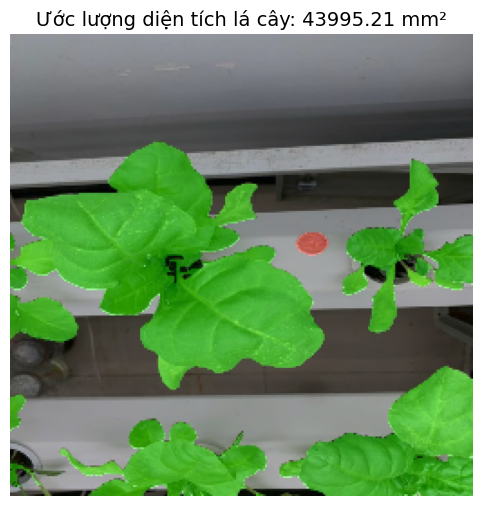

Ước lượng diện tích lá cây: 43995.21 mm²


In [76]:
img_path = '/kaggle/input/btl-dataset/test/1_Xb_3_5_61_13012025_jpg.rf.93661c6fdaf18749215f7291571e966f.jpg'

visualize_prediction_and_area(model, img_path, device)


 Đang predict ảnh: 2_xb_1_5_299_20022025_jpg.rf.06a963dd2f93e54aa9b1ae89aa07c503.jpg


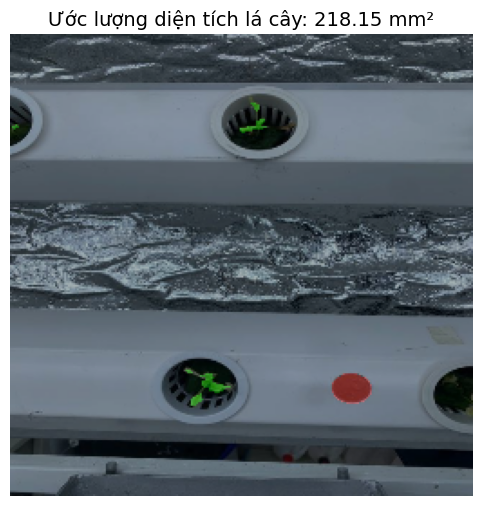

Ước lượng diện tích lá cây: 218.15 mm²

 Đang predict ảnh: 1_xb_1_4_235_14022025_jpg.rf.33044a2bba2758ceb691317a7ffb3528.jpg


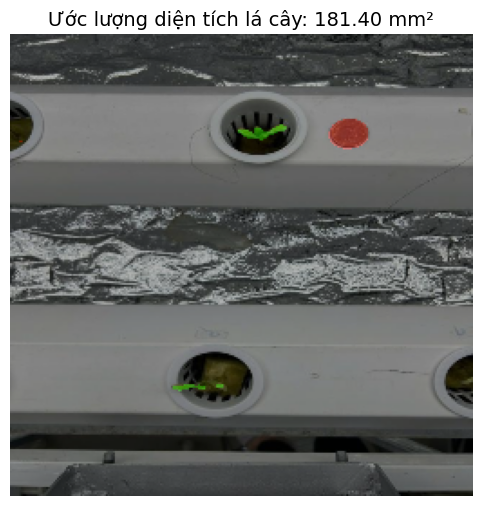

Ước lượng diện tích lá cây: 181.40 mm²

 Đang predict ảnh: 1_xb_1_2_233_20022025_jpg.rf.47fb7f486bc582c6680098b85d969247.jpg


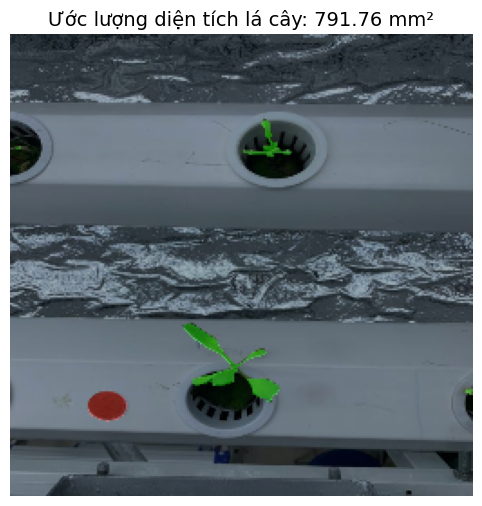

Ước lượng diện tích lá cây: 791.76 mm²

 Đang predict ảnh: 1_xb_1_5_236_10022025_jpg.rf.8edc6fd40712944b88147d5f22de8f98.jpg


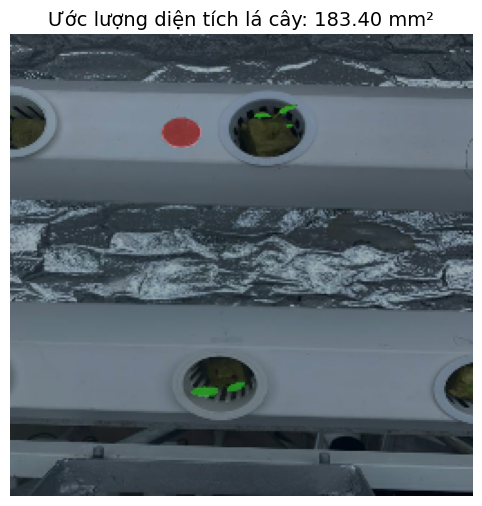

Ước lượng diện tích lá cây: 183.40 mm²

 Đang predict ảnh: 1_Xb_3_5_271_26022025_jpg.rf.3a2099e5eb7e145ba21e120ec27f6cb2.jpg


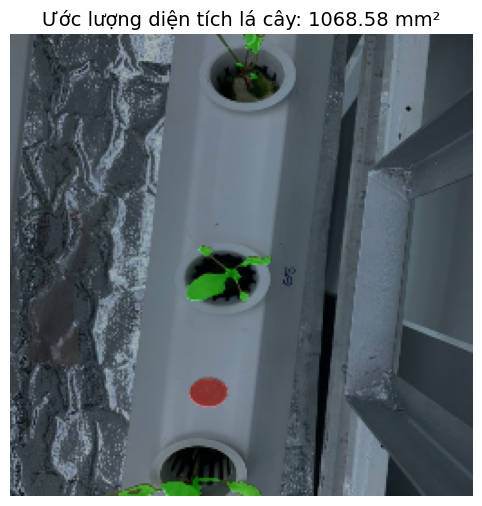

Ước lượng diện tích lá cây: 1068.58 mm²

 Đang predict ảnh: 1_Xb_3_1_267_26022025_jpg.rf.0a417925f6c6af2919b7a7010694bf6d.jpg


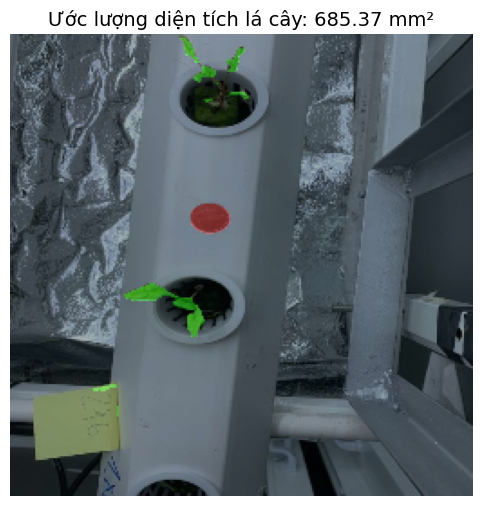

Ước lượng diện tích lá cây: 685.37 mm²

 Đang predict ảnh: 1_Xb_3_4_60_16012025_jpg.rf.a50ce26c4a15e0df7130016d34a46a7d.jpg


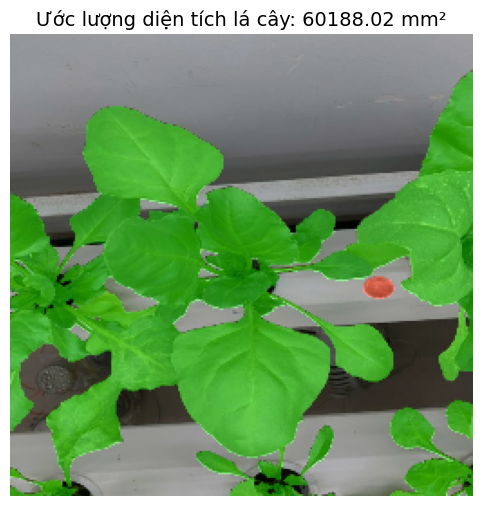

Ước lượng diện tích lá cây: 60188.02 mm²

 Đang predict ảnh: 2_xb_1_3_297_22022025_jpg.rf.305075d29ead46f1d79818d6cf56a06b.jpg


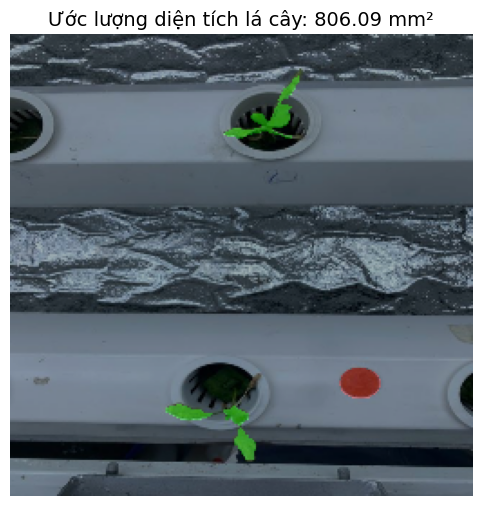

Ước lượng diện tích lá cây: 806.09 mm²

 Đang predict ảnh: 1_Xb_3_5_61_13012025_jpg.rf.93661c6fdaf18749215f7291571e966f.jpg


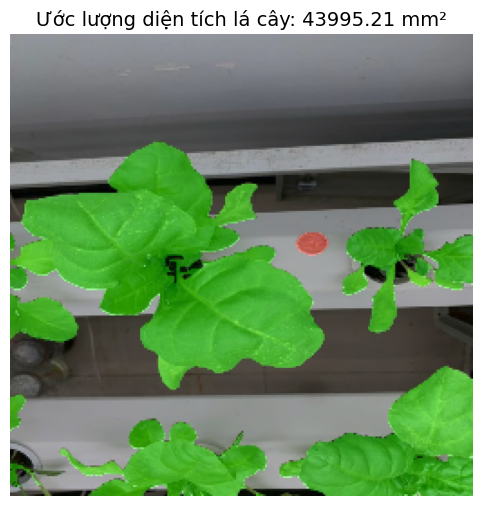

Ước lượng diện tích lá cây: 43995.21 mm²

 Đang predict ảnh: 1_Xb_2_4_53_09012025_jpg.rf.c9198647c4fe3a4973d1742674af2d95.jpg


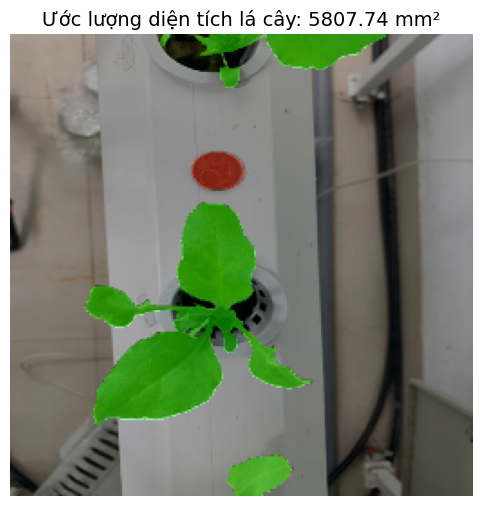

Ước lượng diện tích lá cây: 5807.74 mm²

 Đang predict ảnh: 1_Xb_3_6_272_26022025_jpg.rf.82db6698064cab68d60b82c4272bffb6.jpg


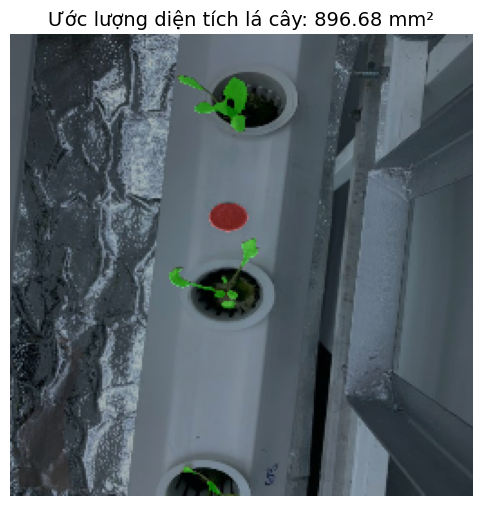

Ước lượng diện tích lá cây: 896.68 mm²

 Đang predict ảnh: 2_Xb_2_4_305_12022025-3-_jpg.rf.48727117bae6974a26586c904cbc785d.jpg


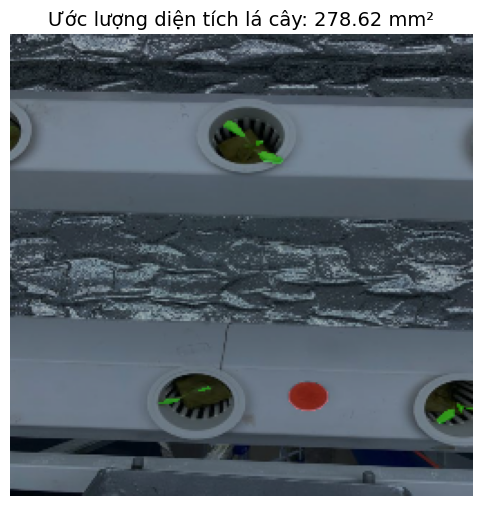

Ước lượng diện tích lá cây: 278.62 mm²

 Đang predict ảnh: 3_Xb_3_4_186_09012025_jpg.rf.e686f156988fe0c736429e6e3f302a7f.jpg


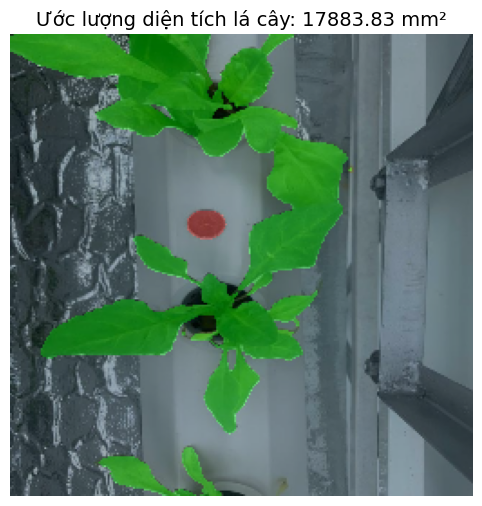

Ước lượng diện tích lá cây: 17883.83 mm²

 Đang predict ảnh: 1_Xb_1_6_237_12022025_jpg.rf.0b111867157f2da15d40e8d12be4e9c9.jpg


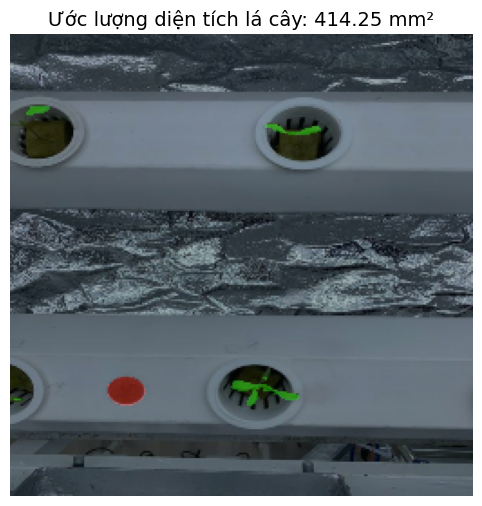

Ước lượng diện tích lá cây: 414.25 mm²

 Đang predict ảnh: 1_Xb_2_1_239_12022025-3-_jpg.rf.4371c4428652340ca4809151ec780cca.jpg


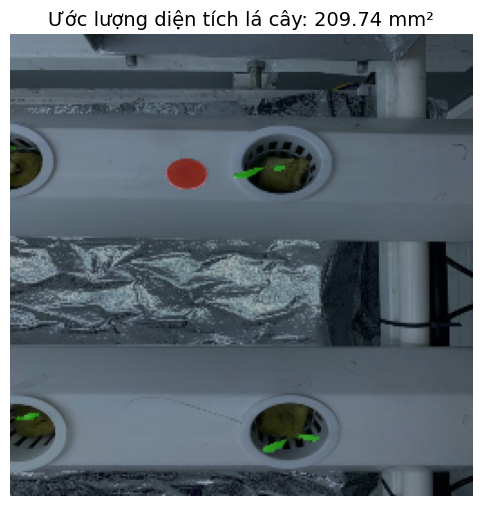

Ước lượng diện tích lá cây: 209.74 mm²

 Đang predict ảnh: 3_X2_1_1_148_13012025_jpg.rf.efa716123d57caa2dab7740bf92952e6.jpg


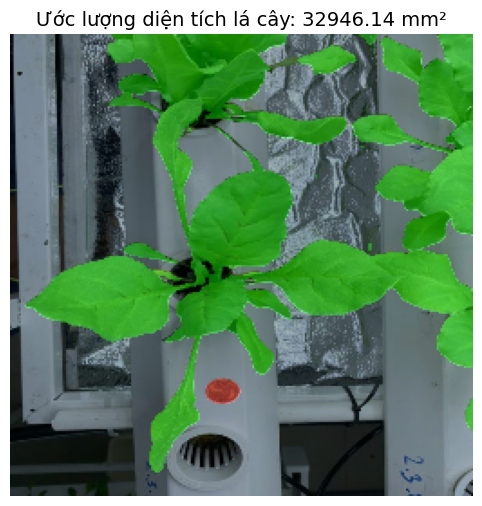

Ước lượng diện tích lá cây: 32946.14 mm²

 Đang predict ảnh: 2_Xb_1_7_301_20250226_jpg.rf.a582bae59b04ad53971b082ba85f9970.jpg


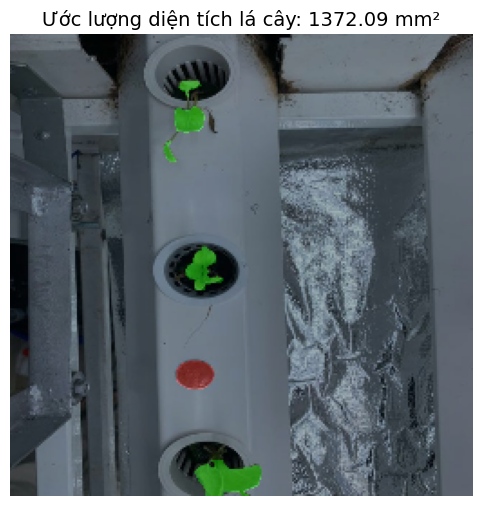

Ước lượng diện tích lá cây: 1372.09 mm²

 Đang predict ảnh: 1_xb_2_7_245_14022025-3-_jpg.rf.4dd5ec759c17b15a5e54706b982d4b88.jpg


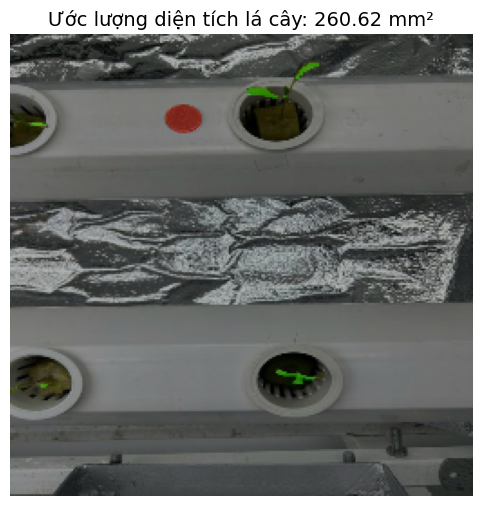

Ước lượng diện tích lá cây: 260.62 mm²

 Đang predict ảnh: 1_X11_1_5_5_11012025_jpg.rf.d18143b6015e9c1b4555f50fc9382184.jpg


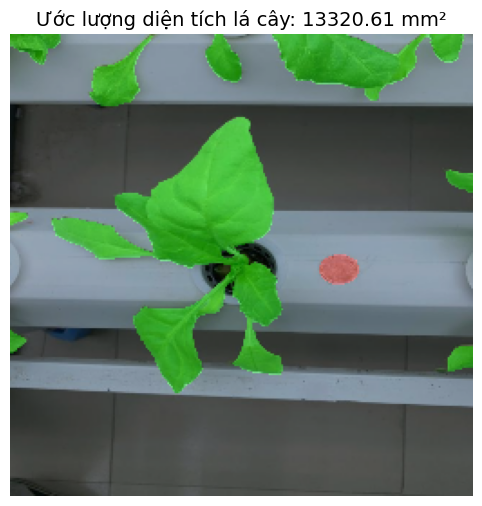

Ước lượng diện tích lá cây: 13320.61 mm²

 Đang predict ảnh: 1_Xb_1_1_232_12022025_jpg.rf.06af94e8188f32755b4f09194d022c00.jpg


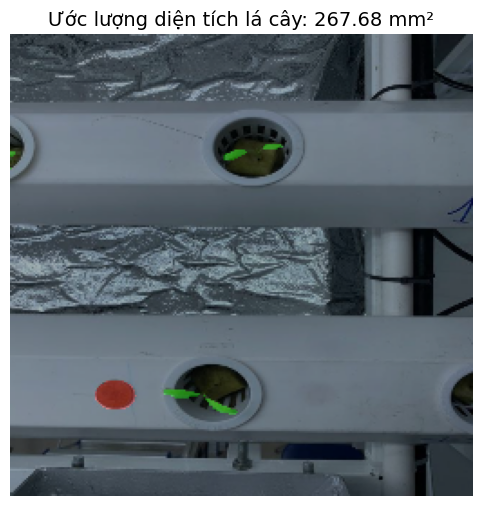

Ước lượng diện tích lá cây: 267.68 mm²

 Đang predict ảnh: 1_Xb_2_7_266_26022025_jpg.rf.233f74315b506c040af0ed1f9d95b7c3.jpg


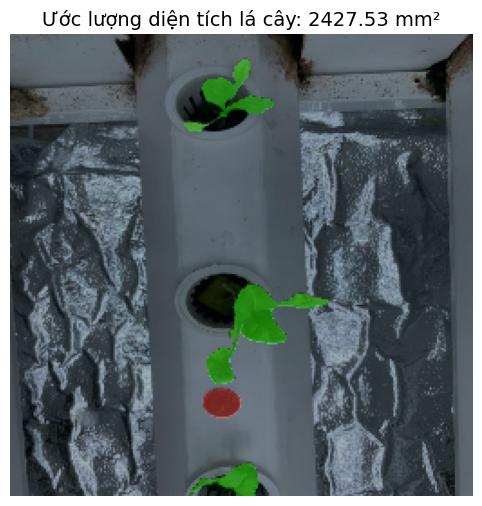

Ước lượng diện tích lá cây: 2427.53 mm²

 Đang predict ảnh: 1_xb_1_1_232_14022025_jpg.rf.92d94f4a77d7b258406875a79716eb73.jpg


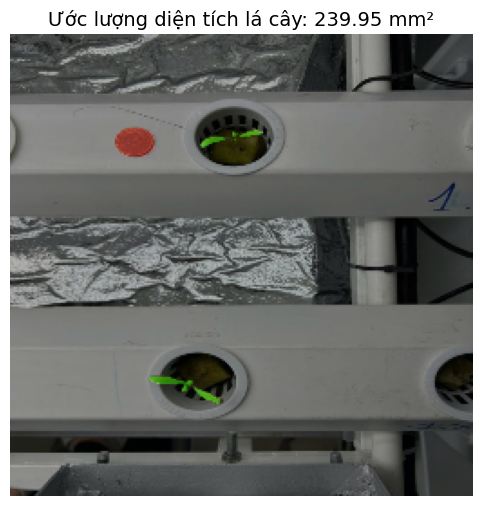

Ước lượng diện tích lá cây: 239.95 mm²

 Đang predict ảnh: 2_Xb_2_3_304_12022025-3-_jpg.rf.ffa10aeca3f31978cd79c4db607f2820.jpg


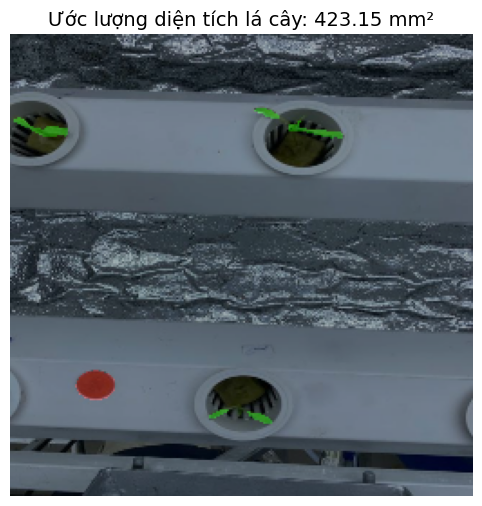

Ước lượng diện tích lá cây: 423.15 mm²

 Đang predict ảnh: 2_Xb_2_4_305_20250226_jpg.rf.6c88d8ac607123d8f7e77b984e63377d.jpg


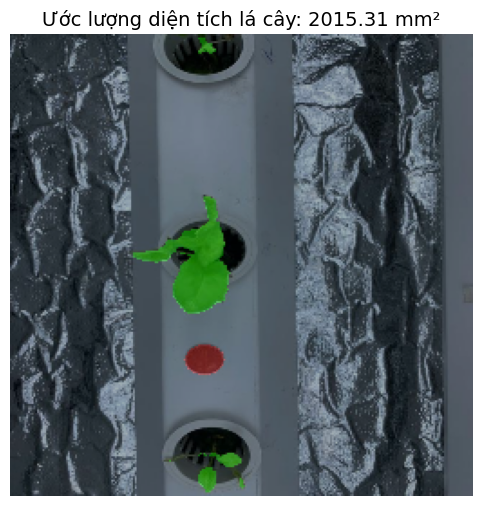

Ước lượng diện tích lá cây: 2015.31 mm²

 Đang predict ảnh: 2_Xb_1_3_297_18022025_jpg.rf.592f8eeec1524c50d0fe0e2307ff4495.jpg


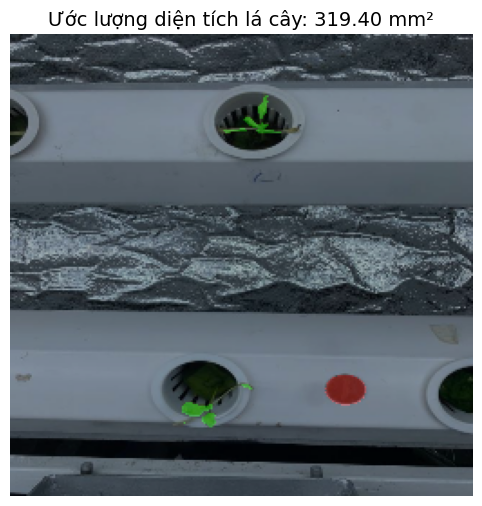

Ước lượng diện tích lá cây: 319.40 mm²

 Đang predict ảnh: 1_Xb_2_1_50_16012025_jpg.rf.20ac41511d1165adfd3c8d22d8d3779d.jpg


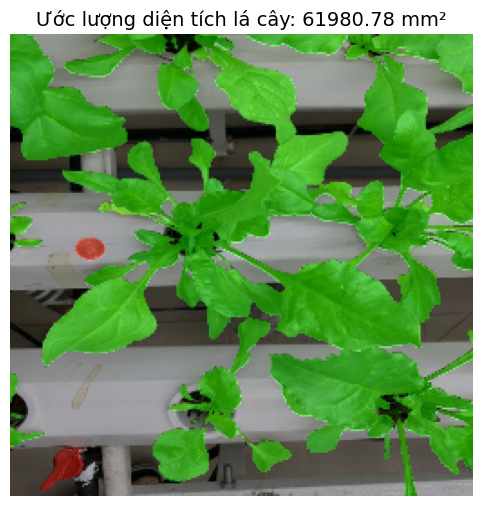

Ước lượng diện tích lá cây: 61980.78 mm²

 Đang predict ảnh: 1_Xb_1_2_44_09012025_jpg.rf.627af02f9fe528440d8446246076cbc9.jpg


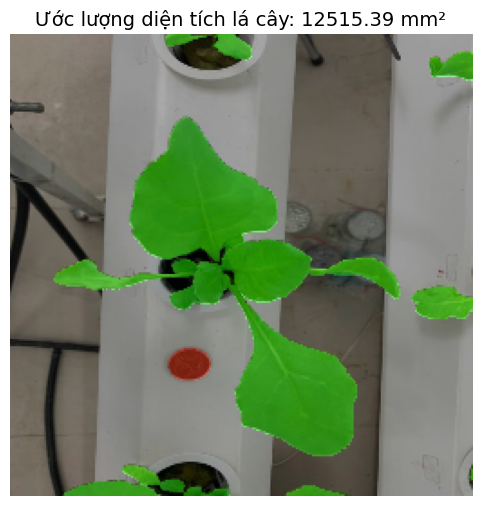

Ước lượng diện tích lá cây: 12515.39 mm²

 Đang predict ảnh: 1_Xb_2_7_56_09012025_jpg.rf.c62184e6dc00d6a5226368751af1d009.jpg


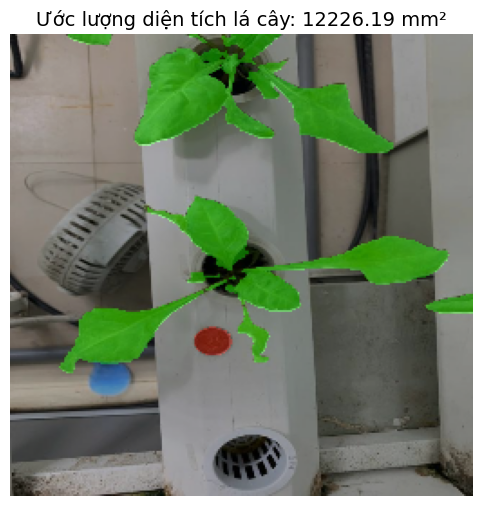

Ước lượng diện tích lá cây: 12226.19 mm²

 Đang predict ảnh: 1_xb_1_3_234_22022025_jpg.rf.76c0a798c975957a15f73697d598ce6a.jpg


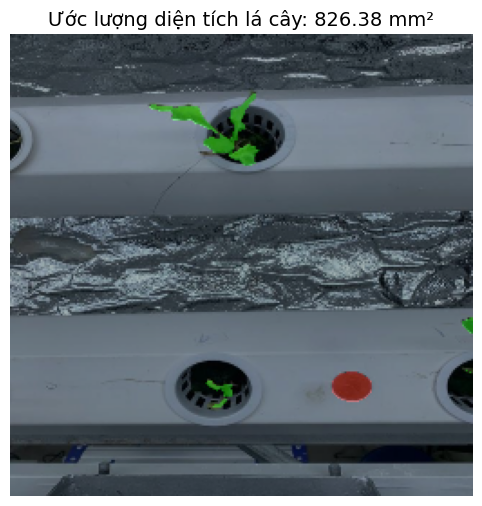

Ước lượng diện tích lá cây: 826.38 mm²

 Đang predict ảnh: 1_xb_2_3_241_14022025-3-_jpg.rf.c922a21117ba7ed40df3c0b6d947e0be.jpg


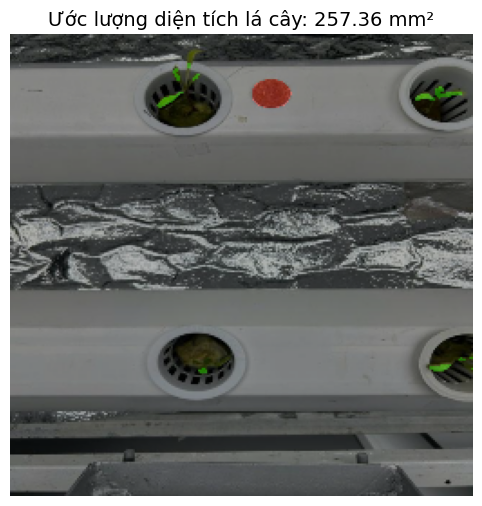

Ước lượng diện tích lá cây: 257.36 mm²

 Đang predict ảnh: 2_Xb_2_7_308_20022025-3-_jpg.rf.f7802900bbb81282cb7b494046452868.jpg


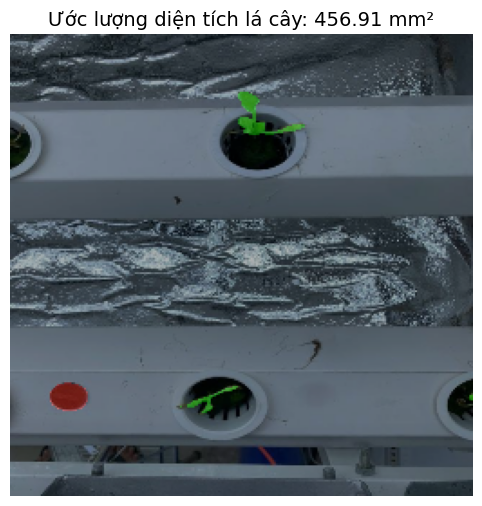

Ước lượng diện tích lá cây: 456.91 mm²

 Đang predict ảnh: 3_Xb_1_2_359_12022025_jpg.rf.8541c450f3556117168215eb65fa50e9.jpg


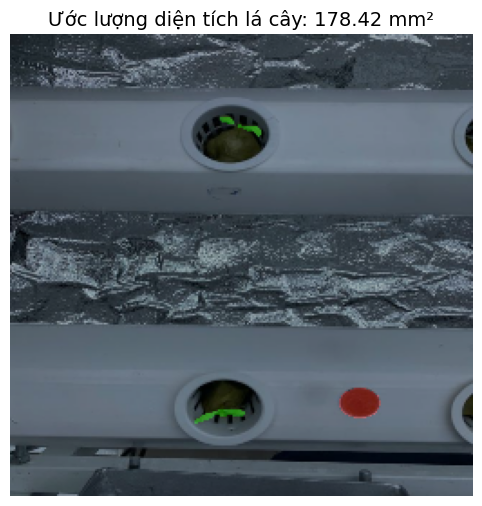

Ước lượng diện tích lá cây: 178.42 mm²

 Đang predict ảnh: 1_xb_1_5_236_20022025_jpg.rf.c395def60b78bf05ac4a810ac84c4fc2.jpg


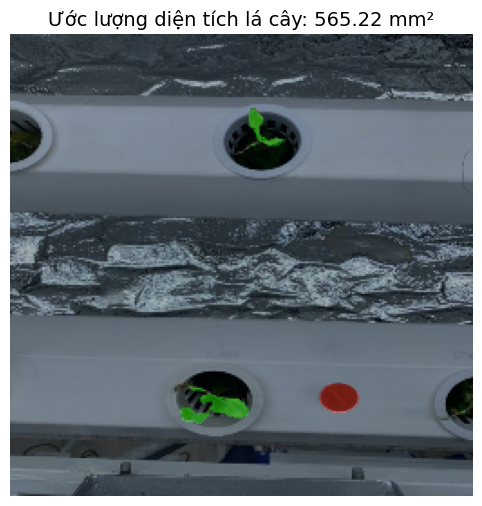

Ước lượng diện tích lá cây: 565.22 mm²

 Đang predict ảnh: 1_Xb_1_6_48_11012025_jpg.rf.c3ba98ff0c61f5528a438772c2f53350.jpg


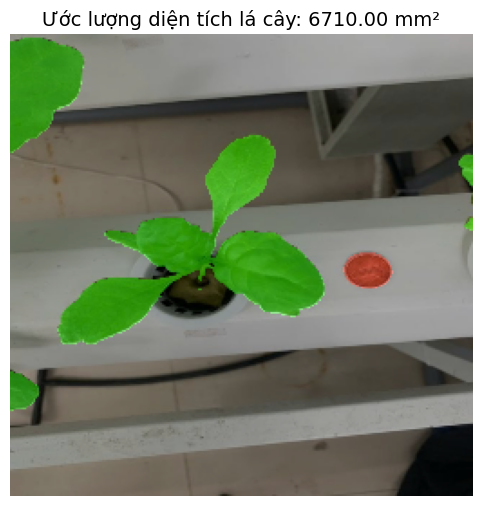

Ước lượng diện tích lá cây: 6710.00 mm²


In [77]:
import os

def batch_predict_and_calculate(model, input_folder, device, coin_real_area_mm2=354.5):
    
    # Dự đoán và tính diện tích lá cho tất cả ảnh trong 1 thư mục.
    
    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png', '.jpeg'))]

    for img_name in image_files:
        img_path = os.path.join(input_folder, img_name)
        print(f"\n Đang predict ảnh: {img_name}")
        visualize_prediction_and_area(model, img_path, device, coin_real_area_mm2)

# Cách gọi 
model.eval()
input_folder = '/kaggle/input/btl-dataset/test'

batch_predict_and_calculate(model, input_folder, device)


In [87]:
import os
import pandas as pd
import cv2
import numpy as np
import torch
from torchvision import transforms
from tqdm import tqdm

def predict_image(model, img_path, device):
    image = cv2.imread(img_path)
    if image is None:
        print(f"Không đọc được ảnh: {img_path}")
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (256, 256))
    input_tensor = transforms.ToTensor()(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)
        pred_mask = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()

    return pred_mask

def calculate_leaf_area_from_mask(mask, coin_real_area_mm2=354.5):
    coin_mask = (mask == 2).astype(np.uint8)
    leaf_mask = (mask == 1).astype(np.uint8)

    coin_area_pixels = np.sum(coin_mask)
    leaf_area_pixels = np.sum(leaf_mask)

    if coin_area_pixels == 0:
        return None

    pixel_to_real_ratio = coin_real_area_mm2 / coin_area_pixels
    leaf_area_real = leaf_area_pixels * pixel_to_real_ratio

    return leaf_area_real

def batch_predict_and_calculate(model, input_folder, device, output_csv_path, coin_real_area_mm2=354.5):
    # Đây mới là thân hàm
    results = []

    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png', '.jpeg'))]

    for img_name in tqdm(image_files, desc="Predicting and calculating leaf areas"):
        img_path = os.path.join(input_folder, img_name)
        mask = predict_image(model, img_path, device)
        if mask is None:
            continue

        leaf_area = calculate_leaf_area_from_mask(mask, coin_real_area_mm2)

        if leaf_area is not None:
            results.append({'image': img_name, 'leaf_area_mm2': leaf_area})
        else:
            results.append({'image': img_name, 'leaf_area_mm2': 'Không tìm thấy đồng xu'})

    df = pd.DataFrame(results)
    df.to_csv(output_csv_path, index=False)
    print(f"\n Đã lưu kết quả vào: {output_csv_path}")

# --- Cách dùng ---
model.eval()
input_folder = '/kaggle/input/btl-dataset/test'
output_csv_path = '/kaggle/working/leaf_area_results.csv'

batch_predict_and_calculate(model, input_folder, device, output_csv_path)


Predicting and calculating leaf areas: 100%|██████████| 34/34 [00:00<00:00, 61.09it/s]


 Đã lưu kết quả vào: /kaggle/working/leaf_area_results.csv
